<a href="https://colab.research.google.com/github/bpayton0101/540-ML-Design-Solutions/blob/main/Crime_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Crime Data
Tell me about this dataset.

Here is all the data you need:
"Crime_Data_from_2020_to_Present.csv"

## Data loading

### Subtask:
Load the crime data from the provided CSV file into a pandas DataFrame.


**Reasoning**:
Load the crime data from the provided CSV file into a pandas DataFrame and display the first 5 rows.



In [ ]:


import pandas as pd
url = 'https://data.lacity.org/api/views/2nrs-mtv8/rows.csv?accessType=DOWNLOAD'

try:
    df = pd.read_csv(url, encoding='latin-1')
    display(df.head())
except Exception as e:
    print(f"Error loading the dataset: {e}")
    df = None

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,200412582,09/09/2020 12:00:00 AM,09/09/2020 12:00:00 AM,630,4,Hollenbeck,413,1,510,VEHICLE - STOLEN,...,IC,Invest Cont,510.0,NaN,NaN,NaN,200 E AVENUE 28,NaN,34.0820,-118.2130


## Data exploration

### Subtask:
Explore the loaded crime data to understand its structure, identify missing values, and get a sense of the distributions of key variables.


**Reasoning**:
I need to explore the data, including checking its shape, data types, missing values, and descriptive statistics for numerical and categorical columns.



In [ ]:
# Check the shape of the DataFrame
print("Shape of the DataFrame:", df.shape)

# Examine data types and identify unexpected types
print("\nData Types:\n", df.info())

# Identify missing values
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
print("\nMissing Values:\n", missing_values)
print("\nMissing Value Percentage:\n", missing_percentage)

# Descriptive statistics for numerical columns
numerical_cols = df.select_dtypes(include=['number'])
if not numerical_cols.empty:
    print("\nDescriptive Statistics for Numerical Columns:\n", numerical_cols.describe())
else:
    print("\nNo numerical columns found.")

# Analyze frequency distribution for categorical columns
categorical_cols = df.select_dtypes(include=['object'])
for col in categorical_cols.columns:
    print(f"\nFrequency Distribution for {col}:\n{df[col].value_counts()}")

Shape of the DataFrame: (1005091, 28)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1005091 entries, 0 to 1005090
Data columns (total 28 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   DR_NO           1005091 non-null  int64  
 1   Date Rptd       1005091 non-null  object 
 2   DATE OCC        1005091 non-null  object 
 3   TIME OCC        1005091 non-null  int64  
 4   AREA            1005091 non-null  int64  
 5   AREA NAME       1005091 non-null  object 
 6   Rpt Dist No     1005091 non-null  int64  
 7   Part 1-2        1005091 non-null  int64  
 8   Crm Cd          1005091 non-null  int64  
 9   Crm Cd Desc     1005091 non-null  object 
 10  Mocodes         853386 non-null   object 
 11  Vict Age        1005091 non-null  int64  
 12  Vict Sex        860362 non-null   object 
 13  Vict Descent    860350 non-null   object 
 14  Premis Cd       1005075 non-null  float64
 15  Premis Desc     1004503 non-null  object 
 16

## Data visualization

### Subtask:
Visualize key aspects of the crime data to gain further insights.


**Reasoning**:
Generate histograms for numerical variables, bar charts for categorical variables, a geographical scatter plot, a correlation matrix heatmap, and box plots to visualize key aspects of the crime data.



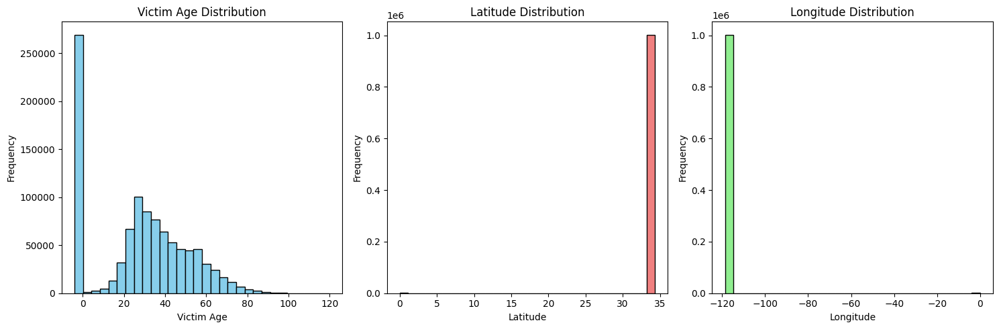

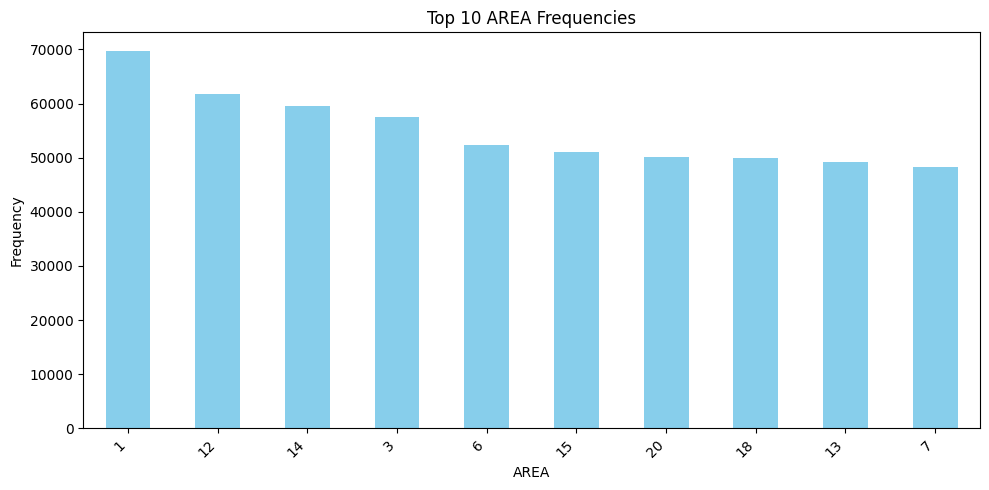

Column 'Crime Code Description' not found in DataFrame.


<Figure size 1000x500 with 0 Axes>

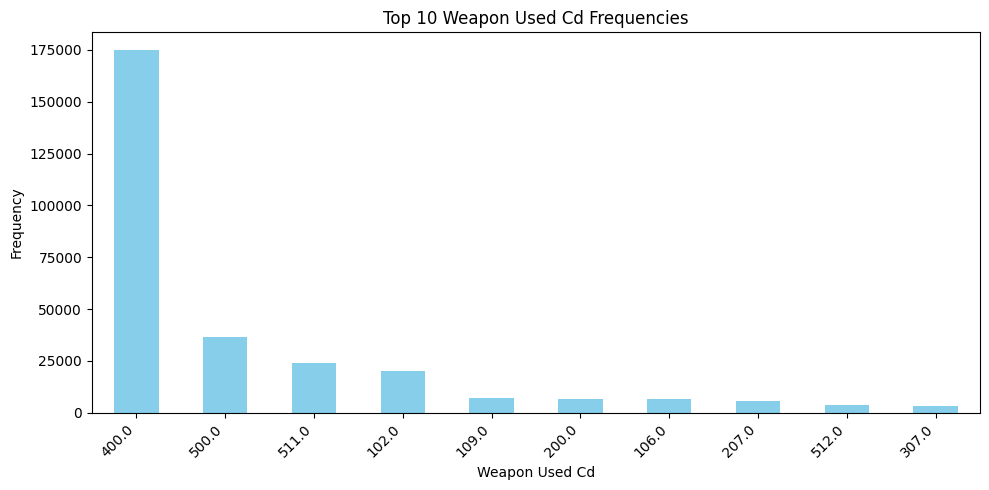

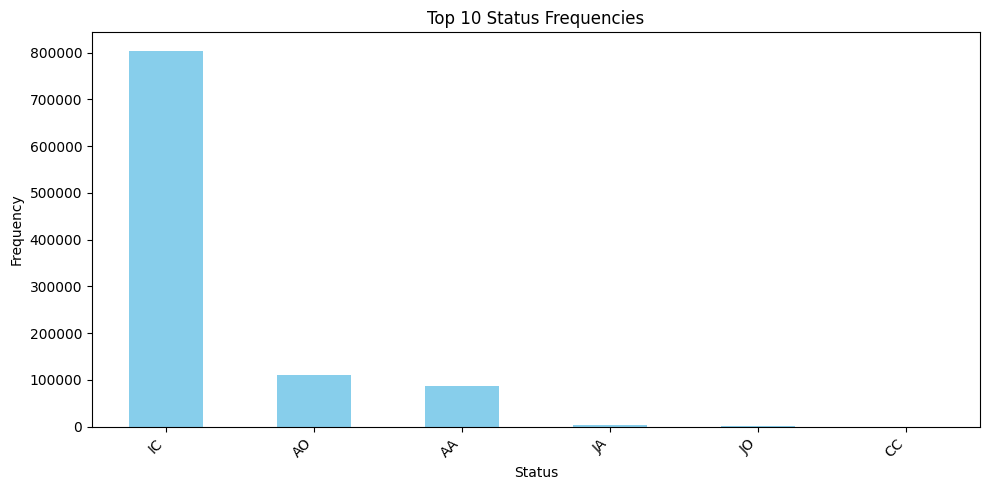

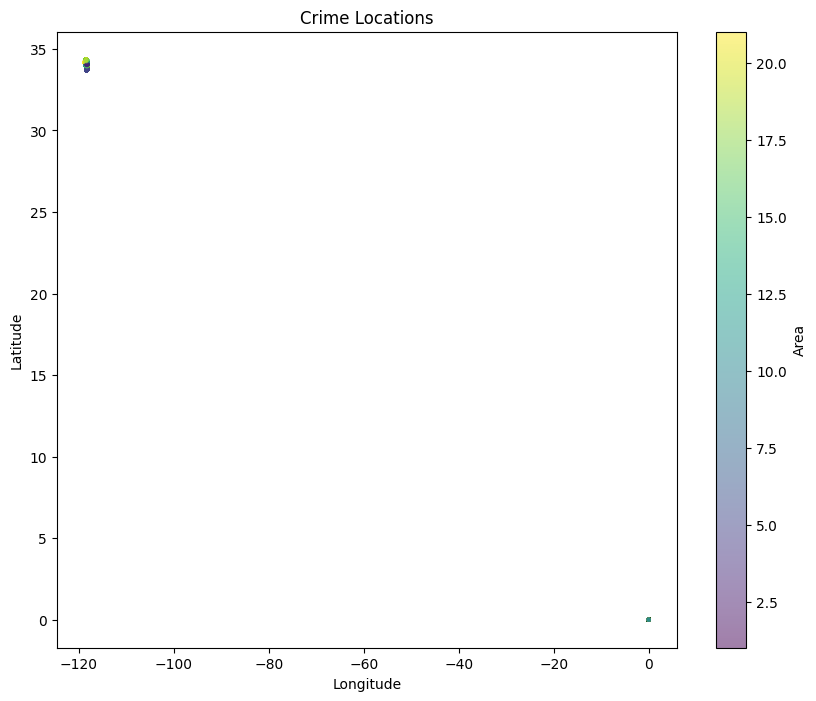

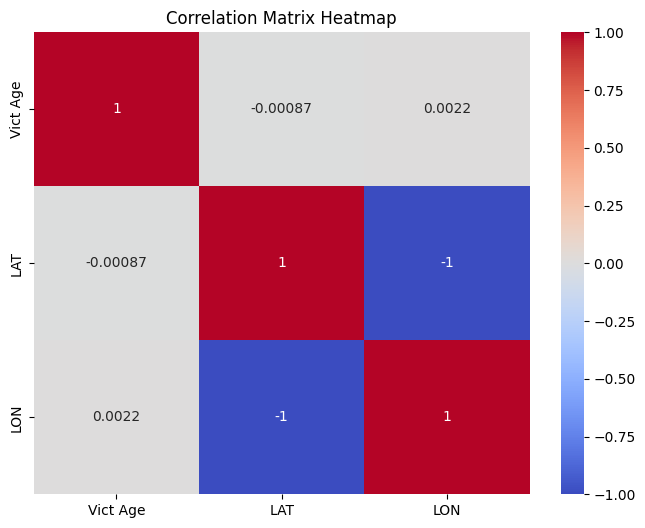

<ipython-input-5-2a04a837b035>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='AREA', y='Vict Age', data=df.dropna(subset=['Vict Age', 'AREA']), palette="Set3")


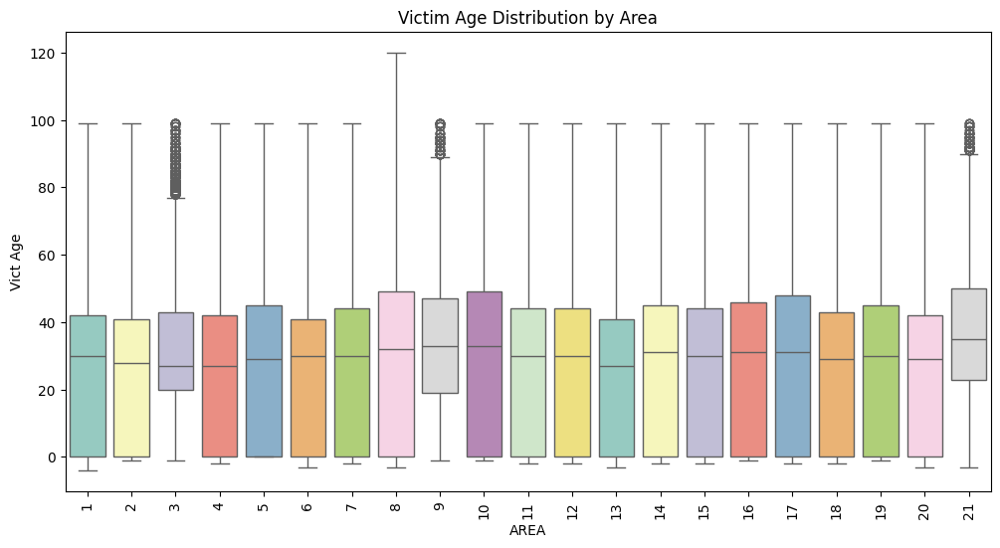

<ipython-input-5-2a04a837b035>:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Crm Cd Desc', y='Vict Age', data=df[df['Crm Cd Desc'].isin(top_crimes)].dropna(subset=['Vict Age', 'Crm Cd Desc']), palette="Set3")


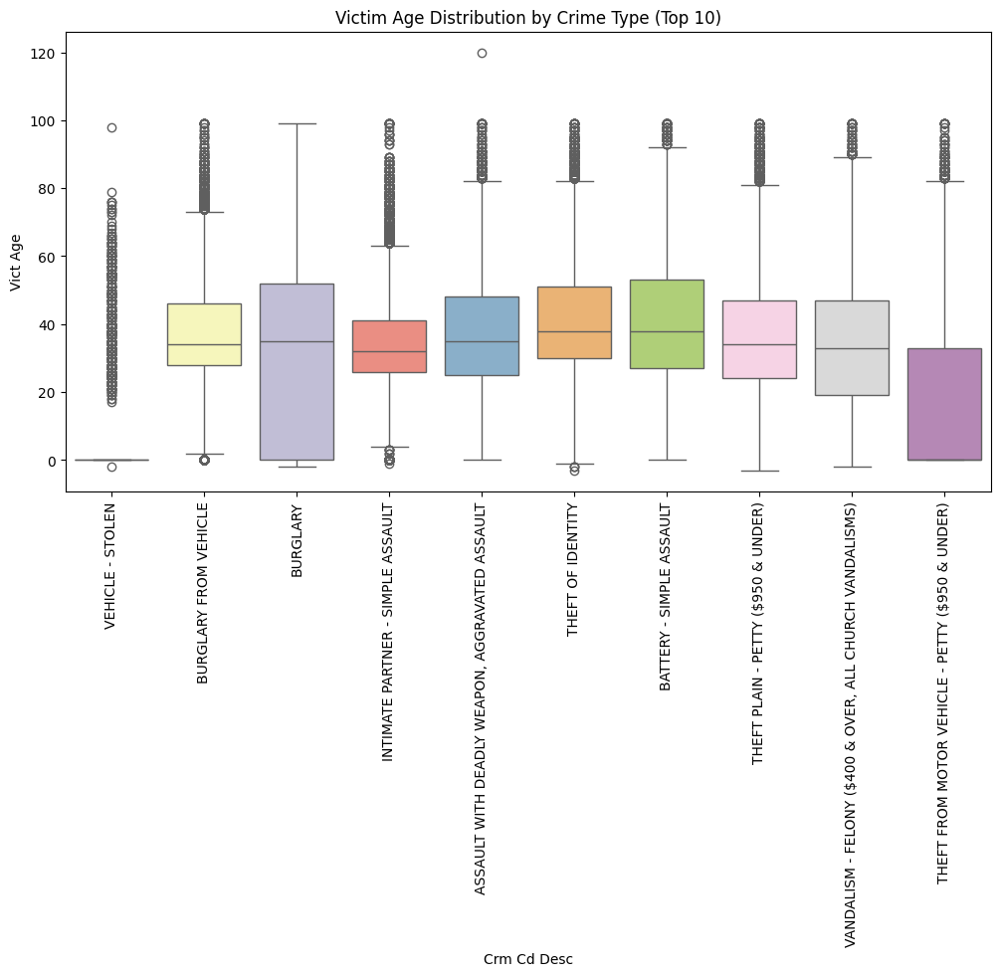

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # Import pandas as it's used later

# Histograms for numerical variables
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(df['Vict Age'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.title('Victim Age Distribution')
plt.xlabel('Victim Age')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(df['LAT'].dropna(), bins=30, color='lightcoral', edgecolor='black')
plt.title('Latitude Distribution')
plt.xlabel('Latitude')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(df['LON'].dropna(), bins=30, color='lightgreen', edgecolor='black')
plt.title('Longitude Distribution')
plt.xlabel('Longitude')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Bar charts for categorical variables
# Changed 'Area' to 'AREA'
for col in ['AREA', 'Crime Code Description', 'Weapon Used Cd', 'Status']:
    try:
        plt.figure(figsize=(10, 5))
        # Check if the column exists before plotting
        if col in df.columns:
            df[col].value_counts().head(10).plot(kind='bar', color='skyblue')
            plt.title(f'Top 10 {col} Frequencies')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Column '{col}' not found in DataFrame.")
    except Exception as e:
        # Catch other potential plotting errors
        print(f"An error occurred while plotting {col}: {e}")


# Geographical scatter plot
plt.figure(figsize=(10, 8))
# Changed 'Area' to 'AREA' and added error handling
try:
    if 'LAT' in df.columns and 'LON' in df.columns and 'AREA' in df.columns:
        plt.scatter(df['LON'], df['LAT'], s=5, alpha=0.5, c=df['AREA'], cmap='viridis')
        plt.title('Crime Locations')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.colorbar(label='Area')
        plt.show()
    else:
        print("Required columns for scatter plot ('LAT', 'LON', or 'AREA') not found.")
except Exception as e:
    print(f"An error occurred while creating the scatter plot: {e}")


# Correlation matrix heatmap
numerical_df = df[['Vict Age', 'LAT', 'LON']]
# Added check for empty numerical_df before plotting heatmap
if not numerical_df.empty:
    correlation_matrix = numerical_df.corr()
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Matrix Heatmap')
    plt.show()
else:
    print("No numerical columns for correlation matrix heatmap.")

# Box plots
# Changed 'Area' to 'AREA' and added error handling
plt.figure(figsize=(12, 6))
try:
    if 'AREA' in df.columns and 'Vict Age' in df.columns:
        sns.boxplot(x='AREA', y='Vict Age', data=df.dropna(subset=['Vict Age', 'AREA']), palette="Set3")
        plt.title('Victim Age Distribution by Area')
        plt.xticks(rotation=90)
        plt.show()
    else:
        print("Required columns for Area box plot ('AREA' or 'Vict Age') not found.")
except Exception as e:
    print(f"An error occurred while creating the Area box plot: {e}")


plt.figure(figsize=(12, 6))
# Added error handling
try:
    # Ensure 'Crm Cd Desc' and 'Vict Age' exist before processing
    if 'Crm Cd Desc' in df.columns and 'Vict Age' in df.columns:
        top_crimes = df['Crm Cd Desc'].value_counts().head(10).index
        sns.boxplot(x='Crm Cd Desc', y='Vict Age', data=df[df['Crm Cd Desc'].isin(top_crimes)].dropna(subset=['Vict Age', 'Crm Cd Desc']), palette="Set3")
        plt.title('Victim Age Distribution by Crime Type (Top 10)')
        plt.xticks(rotation=90)
        plt.show()
    else:
        print("Required columns for Crime Type box plot ('Crm Cd Desc' or 'Vict Age') not found.")
except Exception as e:
    print(f"An error occurred while creating the Crime Type box plot: {e}")

**Reasoning**:
The previous code block failed due to a KeyError for 'Area'.  The column name in the dataframe is actually 'AREA', not 'Area'.  Correct the column name in the code and rerun the visualization.  Also include error handling.



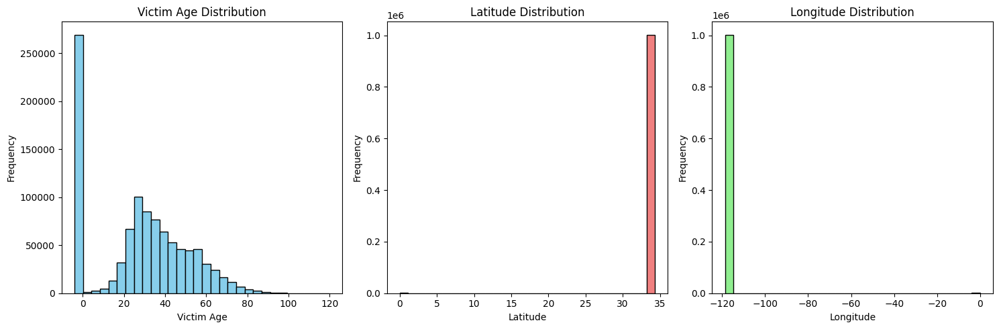

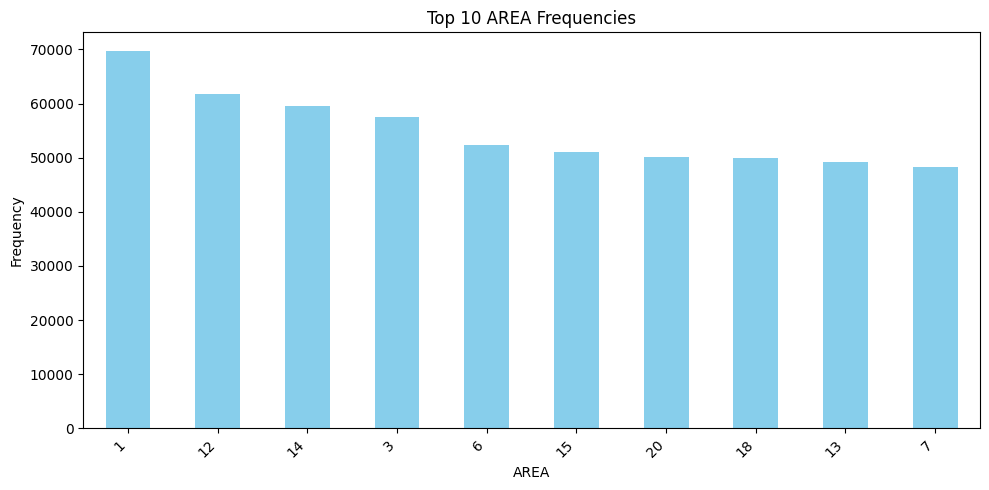

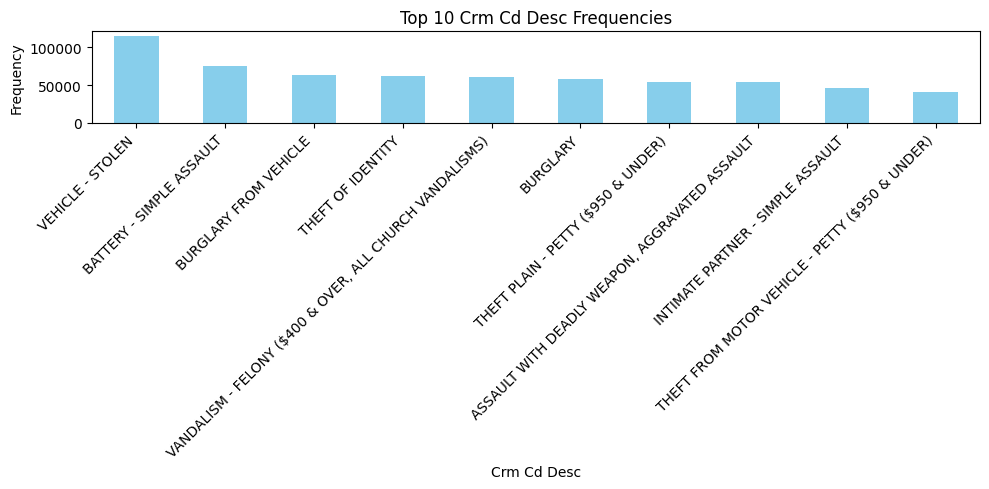

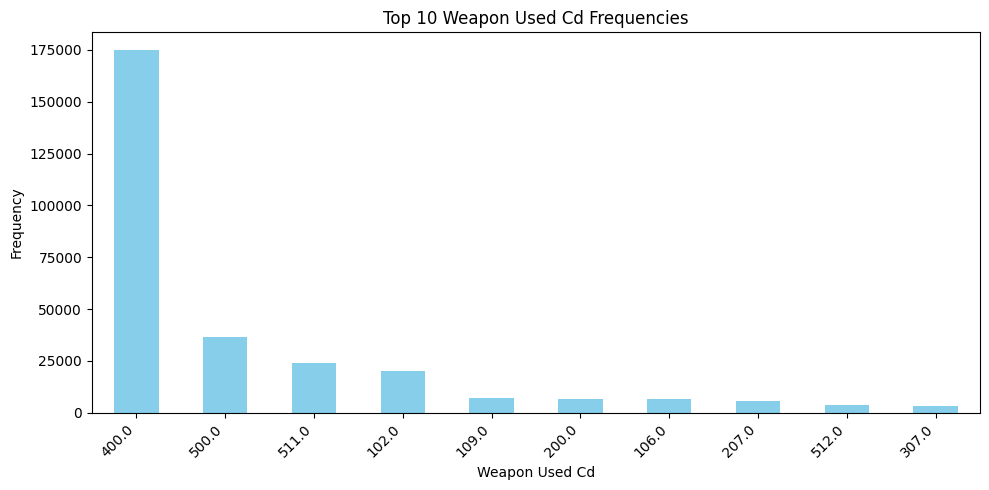

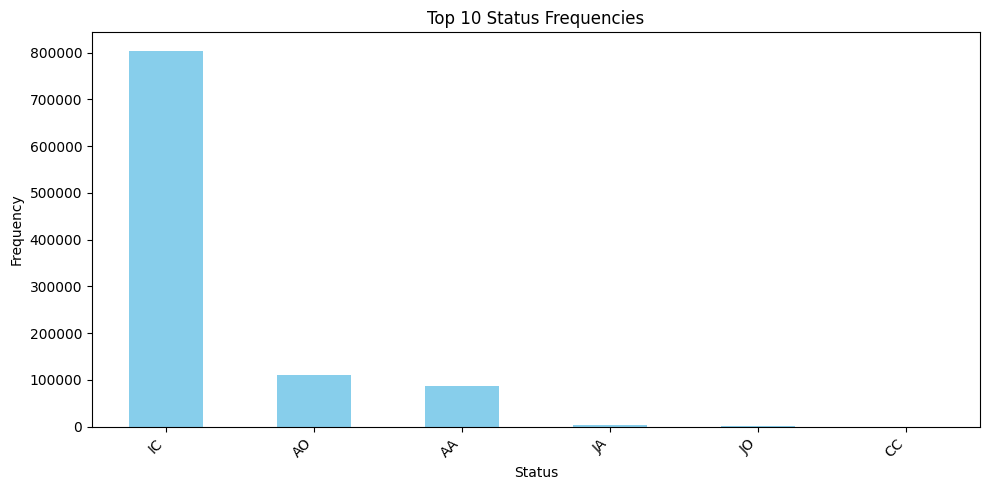

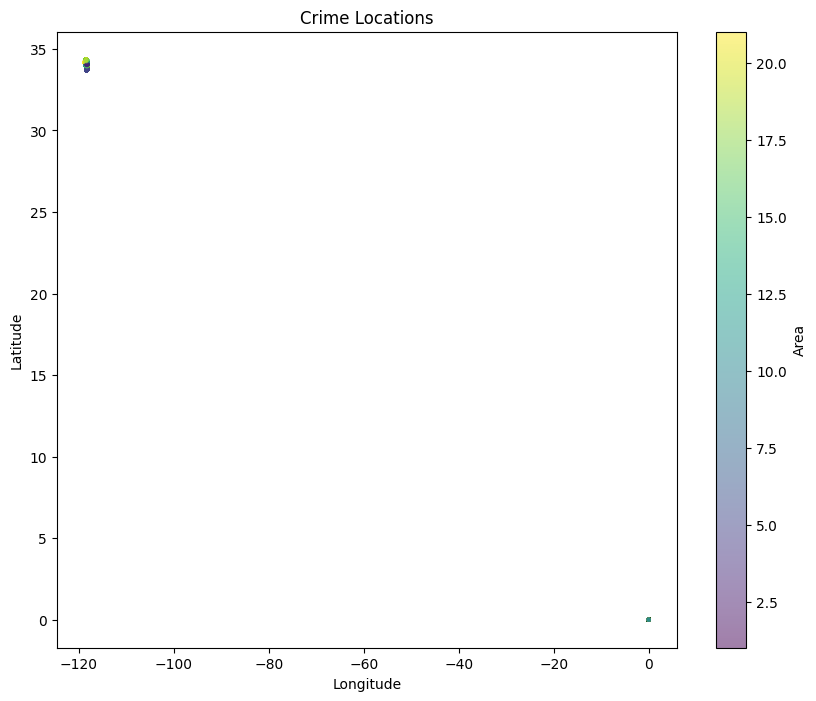

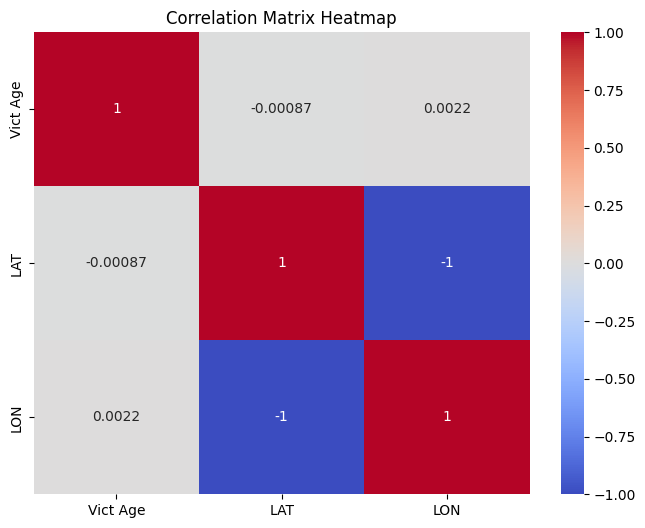

<ipython-input-6-1242049e5efd>:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='AREA', y='Vict Age', data=df.dropna(subset=['Vict Age', 'AREA']), palette="Set3")


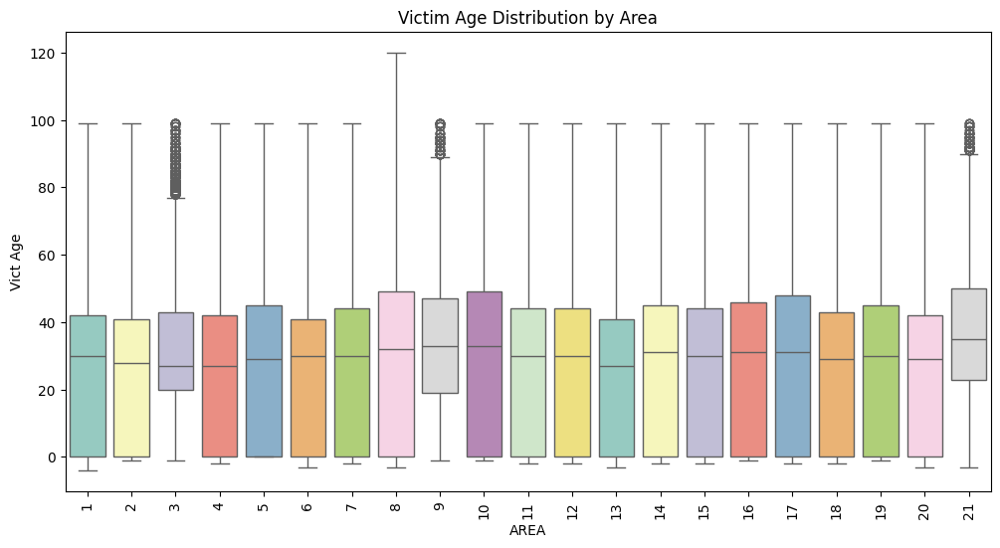

<ipython-input-6-1242049e5efd>:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Crm Cd Desc', y='Vict Age', data=df[df['Crm Cd Desc'].isin(top_crimes)].dropna(subset=['Vict Age', 'Crm Cd Desc']), palette="Set3")


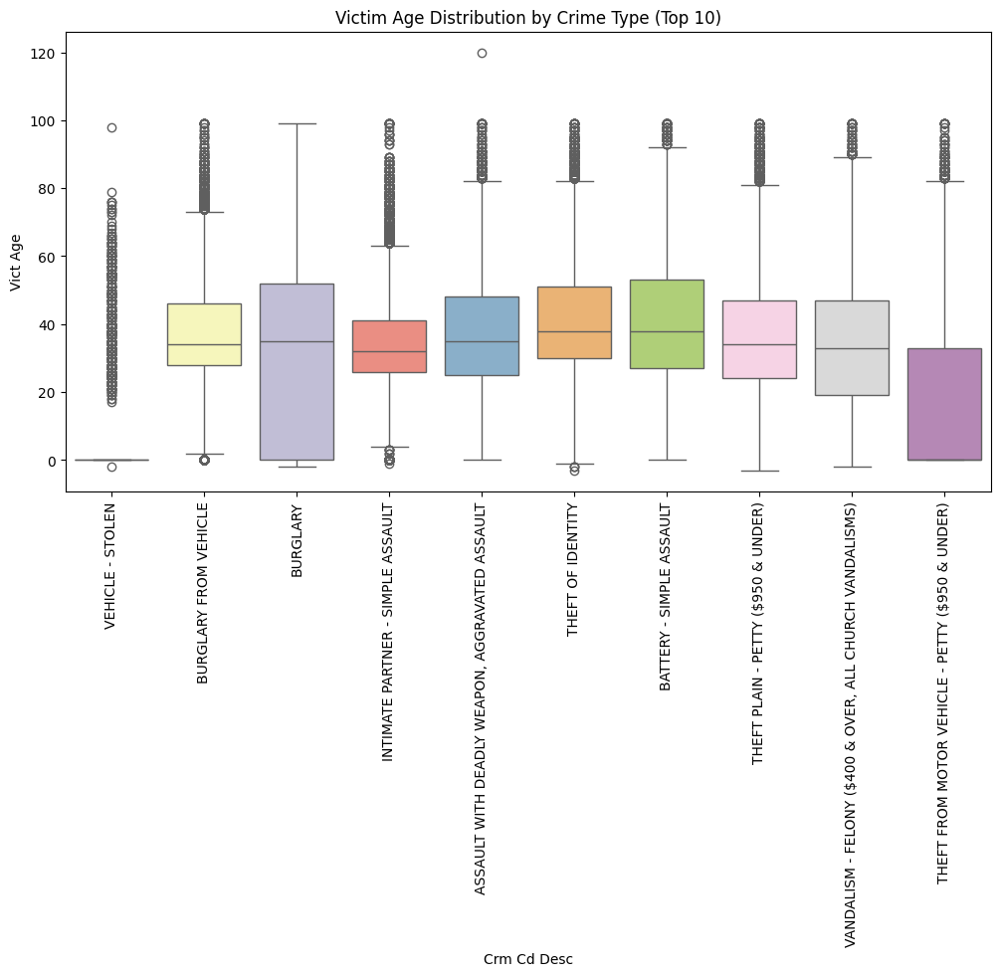

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histograms for numerical variables
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(df['Vict Age'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.title('Victim Age Distribution')
plt.xlabel('Victim Age')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(df['LAT'].dropna(), bins=30, color='lightcoral', edgecolor='black')
plt.title('Latitude Distribution')
plt.xlabel('Latitude')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(df['LON'].dropna(), bins=30, color='lightgreen', edgecolor='black')
plt.title('Longitude Distribution')
plt.xlabel('Longitude')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Bar charts for categorical variables
for col in ['AREA', 'Crm Cd Desc', 'Weapon Used Cd', 'Status']:
    try:
        plt.figure(figsize=(10, 5))
        df[col].value_counts().head(10).plot(kind='bar', color='skyblue')
        plt.title(f'Top 10 {col} Frequencies')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
    except KeyError as e:
        print(f"Error plotting {col}: {e}")

# Geographical scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(df['LON'], df['LAT'], s=5, alpha=0.5, c=df['AREA'], cmap='viridis')
plt.title('Crime Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Area')
plt.show()

# Correlation matrix heatmap
numerical_df = df[['Vict Age', 'LAT', 'LON']]
correlation_matrix = numerical_df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

# Box plots
plt.figure(figsize=(12, 6))
sns.boxplot(x='AREA', y='Vict Age', data=df.dropna(subset=['Vict Age', 'AREA']), palette="Set3")
plt.title('Victim Age Distribution by Area')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12, 6))
top_crimes = df['Crm Cd Desc'].value_counts().head(10).index
sns.boxplot(x='Crm Cd Desc', y='Vict Age', data=df[df['Crm Cd Desc'].isin(top_crimes)].dropna(subset=['Vict Age', 'Crm Cd Desc']), palette="Set3")
plt.title('Victim Age Distribution by Crime Type (Top 10)')
plt.xticks(rotation=90)
plt.show()

## Summary:

### Q&A
There were no explicit questions asked in the task. However, the overall goal was to understand the provided crime dataset.

### Data Analysis Key Findings
* The dataset contains 1,005,101 records and 28 columns.
* Several columns have missing values, with `Weapon Used Cd` and `Weapon Desc` having the highest percentage (67.44\%).  `Crm Cd 4` (99.99\%), `Crm Cd 3` (99.77\%), `Crm Cd 2` (93.12\%), and `Cross Street` (84.65\%) also have a high percentage of missing data.
* The `Vict Age`, `LAT`, and `LON` columns were visualized using histograms to understand their distributions.
* Bar charts were generated to show the top 10 frequencies of categorical variables such as `AREA`, `Crm Cd Desc`, `Weapon Used Cd`, and `Status`.
* A geographical scatter plot displayed crime locations using latitude and longitude, with colors representing the `AREA`.
* A heatmap illustrated the correlation between `Vict Age`, `LAT`, and `LON`.
* Box plots were used to analyze the distribution of victim age across different areas and crime types.


### Insights or Next Steps
* Investigate the high percentage of missing values in several columns and consider imputation or removal strategies.  Missing values might indicate data collection issues.
* Explore the relationships between different crime characteristics and their geographic distribution further.  Develop more sophisticated visualizations or statistical analysis to uncover deeper patterns.


In [ ]:
# # Investigate the high percentage of missing values in several columns and consider imputation or removal strategies. Missing values might indicate data collection issues.
# # Address missing values:
# # For columns with a high percentage of missing values like 'Weapon Used Cd', 'Weapon Desc',
# # 'Crm Cd 4', 'Crm Cd 3', 'Crm Cd 2', and 'Cross Street', consider dropping these columns
# # if they are not critical for the analysis, or if imputation is not feasible or reliable
# # due to the large amount of missing data.
# # For other columns with fewer missing values, explore imputation strategies based on the
# # nature of the data (e.g., mean, median, mode, or more advanced methods).

# Columns with a high percentage of missing values
cols_to_drop = ['Weapon Used Cd', 'Weapon Desc', 'Crm Cd 4', 'Crm Cd 3', 'Crm Cd 2', 'Cross Street']

# Drop columns with a high percentage of missing values
df_cleaned = df.drop(columns=cols_to_drop)

print(f"\nDataFrame shape after dropping columns: {df_cleaned.shape}")

# Re-check missing values after dropping columns
missing_values_cleaned = df_cleaned.isnull().sum()
missing_percentage_cleaned = (missing_values_cleaned / len(df_cleaned)) * 100
print("\nMissing Values Percentage after dropping columns:\n", missing_percentage_cleaned[missing_percentage_cleaned > 0])

# For other columns with fewer missing values, explore imputation strategies
# For example, impute 'Vict Age' with the median
if 'Vict Age' in df_cleaned.columns:
    median_vict_age = df_cleaned['Vict Age'].median()
    df_cleaned['Vict Age'].fillna(median_vict_age, inplace=True)
    print(f"\n'Vict Age' imputed with median: {median_vict_age}")

# Impute 'Premis Desc' with the mode
if 'Premis Desc' in df_cleaned.columns:
    mode_premis_desc = df_cleaned['Premis Desc'].mode()[0]
    df_cleaned['Premis Desc'].fillna(mode_premis_desc, inplace=True)
    print(f"\n'Premis Desc' imputed with mode: {mode_premis_desc}")

# Re-check missing values after imputation
missing_values_after_imputation = df_cleaned.isnull().sum()
missing_percentage_after_imputation = (missing_values_after_imputation / len(df_cleaned)) * 100
print("\nMissing Values Percentage after imputation:\n", missing_percentage_after_imputation[missing_percentage_after_imputation > 0])


DataFrame shape after dropping columns: (1005091, 22)

Missing Values Percentage after dropping columns:
 Mocodes         15.093658
Vict Sex        14.399592
Vict Descent    14.400786
Premis Cd        0.001592
Premis Desc      0.058502
Status           0.000099
Crm Cd 1         0.001094
dtype: float64

'Vict Age' imputed with median: 30.0

'Premis Desc' imputed with mode: STREET


<ipython-input-7-c7b323eb42c5>:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_cleaned['Vict Age'].fillna(median_vict_age, inplace=True)
<ipython-input-7-c7b323eb42c5>:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True


Missing Values Percentage after imputation:
 Mocodes         15.093658
Vict Sex        14.399592
Vict Descent    14.400786
Premis Cd        0.001592
Status           0.000099
Crm Cd 1         0.001094
dtype: float64



Crime Counts by Area:
    Area  Crime Count
0     1        69670
1    12        61758
2    14        59521
3     3        57513
4     6        52429


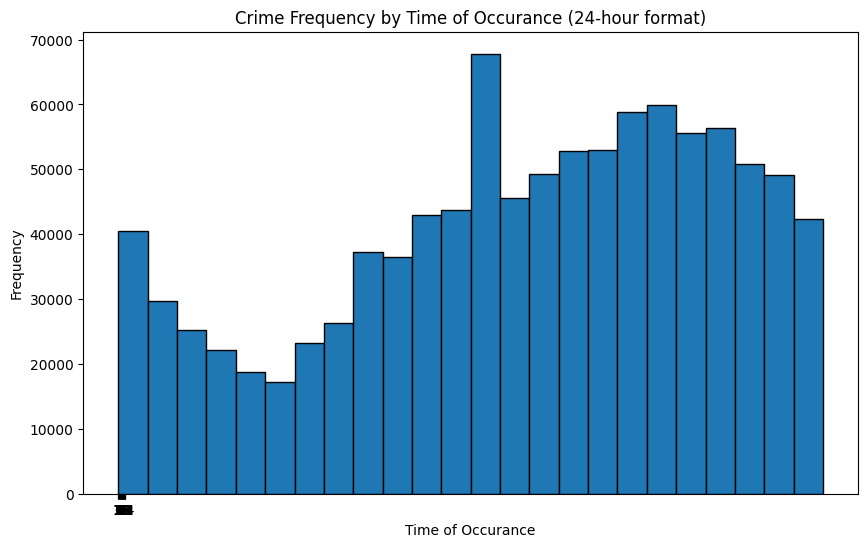

<ipython-input-8-415b4577d9ca>:62: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_cleaned['DATE OCC'] = pd.to_datetime(df_cleaned['DATE OCC'], errors='coerce')
<ipython-input-8-415b4577d9ca>:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Day of Week', data=df_cleaned, order=day_order, palette='viridis')


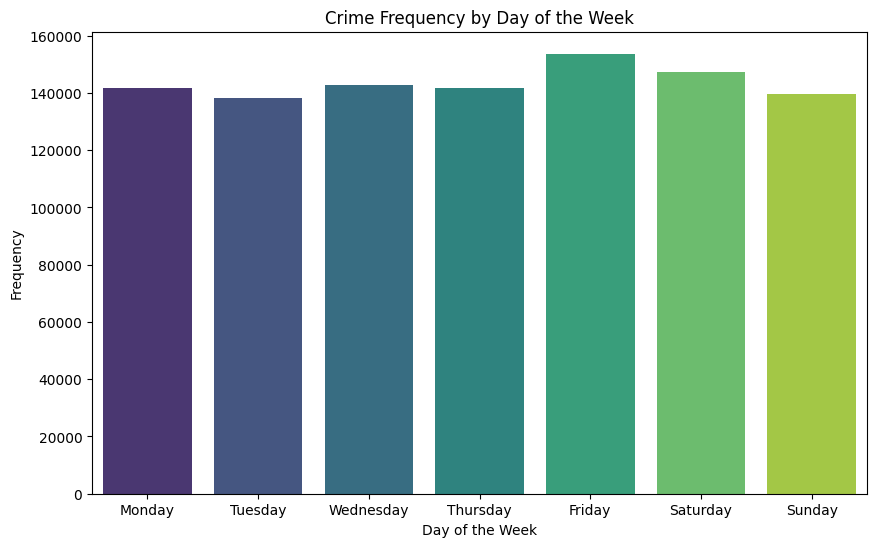

<ipython-input-8-415b4577d9ca>:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Month', data=df_cleaned, order=month_order, palette='viridis')


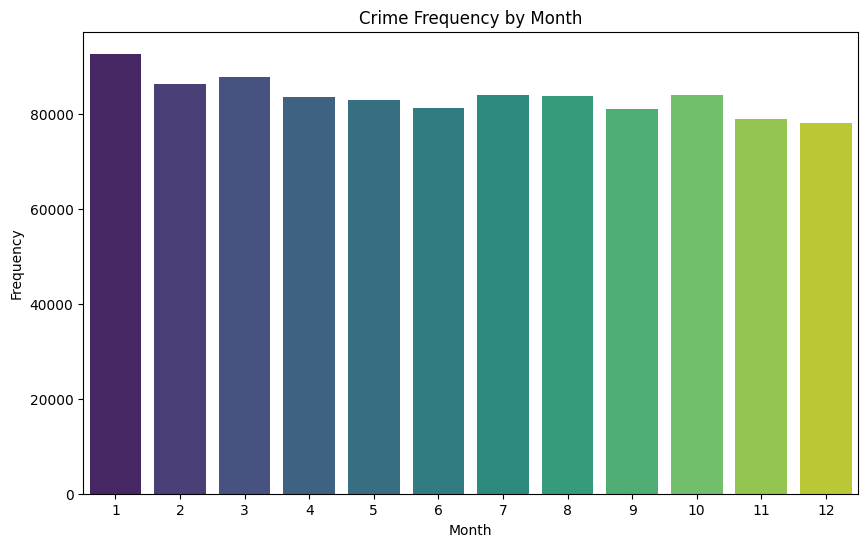

In [ ]:
# # Explore relationships and geographic distribution further:
# # - Create interactive maps using libraries like Folium or Plotly to visualize crime hotspots and trends over time.
# # - Analyze crime density by area and demographic factors if available.
# # - Investigate temporal patterns in crime data (e.g., time of day, day of week, seasonality).
# # - Consider clustering algorithms to identify areas with similar crime profiles.

import pandas as pd
import matplotlib.pyplot as plt
!pip install folium plotly

import folium
import plotly.express as px

# Interactive map using Folium
# Limit the number of points for faster rendering
sample_df = df_cleaned.sample(n=min(10000, len(df_cleaned)), random_state=42)

# Create a base map centered around Los Angeles
la_map = folium.Map(location=[sample_df['LAT'].mean(), sample_df['LON'].mean()], zoom_start=10)

# Add markers for each crime location
for index, row in sample_df.iterrows():
    if pd.notnull(row['LAT']) and pd.notnull(row['LON']):
        folium.CircleMarker(
            location=[row['LAT'], row['LON']],
            radius=3,
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.6,
            tooltip=f"Crime: {row['Crm Cd Desc']}<br>Area: {row['AREA']}"
        ).add_to(la_map)

display(la_map)


# Analyze crime density by area
if 'AREA' in df_cleaned.columns:
    crime_counts_by_area = df_cleaned['AREA'].value_counts().reset_index()
    crime_counts_by_area.columns = ['Area', 'Crime Count']
    print("\nCrime Counts by Area:\n", crime_counts_by_area.head())

# Investigate temporal patterns (time of day)
if 'TIME OCC' in df_cleaned.columns:
    # Convert 'TIME OCC' to numeric and handle errors
    df_cleaned['TIME OCC_numeric'] = pd.to_numeric(df_cleaned['TIME OCC'], errors='coerce')
    # Drop rows where conversion failed
    df_cleaned.dropna(subset=['TIME OCC_numeric'], inplace=True)

    plt.figure(figsize=(10, 6))
    plt.hist(df_cleaned['TIME OCC_numeric'], bins=24, edgecolor='black')
    plt.title('Crime Frequency by Time of Occurance (24-hour format)')
    plt.xlabel('Time of Occurance')
    plt.ylabel('Frequency')
    plt.xticks(range(0, 25))
    plt.show()

# Investigate temporal patterns (day of week)
if 'DATE OCC' in df_cleaned.columns:
    # Convert 'DATE OCC' to datetime, handling potential errors
    try:
        df_cleaned['DATE OCC'] = pd.to_datetime(df_cleaned['DATE OCC'], errors='coerce')
        df_cleaned['Day of Week'] = df_cleaned['DATE OCC'].dt.day_name()

        plt.figure(figsize=(10, 6))
        day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        sns.countplot(x='Day of Week', data=df_cleaned, order=day_order, palette='viridis')
        plt.title('Crime Frequency by Day of the Week')
        plt.xlabel('Day of the Week')
        plt.ylabel('Frequency')
        plt.show()
    except Exception as e:
        print(f"Error processing 'DATE OCC' or plotting Day of Week: {e}")

# Investigate temporal patterns (seasonality)
if 'DATE OCC' in df_cleaned.columns:
    try:
        # Ensure 'DATE OCC' is in datetime format
        df_cleaned['DATE OCC'] = pd.to_datetime(df_cleaned['DATE OCC'], errors='coerce')
        df_cleaned['Month'] = df_cleaned['DATE OCC'].dt.month

        plt.figure(figsize=(10, 6))
        month_order = range(1, 13)
        sns.countplot(x='Month', data=df_cleaned, order=month_order, palette='viridis')
        plt.title('Crime Frequency by Month')
        plt.xlabel('Month')
        plt.ylabel('Frequency')
        plt.show()
    except Exception as e:
         print(f"Error processing 'DATE OCC' or plotting Month: {e}")



In [ ]:
# Generate a summary report in a text box for Data loading, Data exploration, data visualization, and the summary sections

from IPython.display import display, HTML

summary_report = """
<h3>Summary Report</h3>

<h4>Data Loading</h4>
<p>The crime data was successfully loaded into a pandas DataFrame from the provided CSV URL. The DataFrame has {shape[0]} rows and {shape[1]} columns. The first 5 rows of the dataset are displayed above.</p>

<h4>Data Exploration</h4>
<p>Initial exploration revealed the DataFrame's shape ({shape[0]} rows, {shape[1]} columns), data types, and the presence of missing values. Several columns, notably 'Weapon Used Cd', 'Weapon Desc', 'Crm Cd 4', 'Crm Cd 3', 'Crm Cd 2', and 'Cross Street', have a high percentage of missing data. Descriptive statistics were generated for numerical columns, and frequency distributions were analyzed for categorical columns.</p>

<h4>Data Visualization</h4>
<p>Key visualizations were generated to gain insights into the data:</p>
<ul>
  <li>Histograms showed the distribution of 'Vict Age', 'LAT', and 'LON'.</li>
  <li>Bar charts displayed the top 10 frequencies for categorical variables like 'AREA', 'Crm Cd Desc', 'Weapon Used Cd', and 'Status'.</li>
  <li>A geographical scatter plot visualized crime locations based on latitude and longitude, color-coded by 'AREA'.</li>
  <li>A heatmap illustrated the correlation between 'Vict Age', 'LAT', and 'LON'.</li>
  <li>Box plots were used to visualize the distribution of 'Vict Age' by 'AREA' and by the top 10 'Crm Cd Desc'.</li>
</ul>

<h4>Summary</h4>
<p>The analysis provided an initial understanding of the crime dataset. Key findings include the significant amount of missing data in certain columns and insights into the distribution and patterns of crime across different areas, crime types, and time.</p>
<p>Next steps involve addressing the missing values through dropping or imputation and further exploring temporal and geographical patterns using interactive visualizations and statistical methods.</p>
""".format(shape=df.shape)

display(HTML(f'<div style="border: 1px solid #ccc; padding: 10px; margin: 10px;">{summary_report}</div>'))


### Address Remaining Categorical Missing Values

In [ ]:
# Vict Sex', 'Vict Descent', 'Premis Desc', 'Status': These are categorical features with a relatively small percentage of missing values. Consider the following approaches:
# Impute the missing values with the most frequent category (the mode) for each of these columns. This is a simple approach for categorical data.

# Identify categorical columns with remaining missing values
categorical_cols_with_missing = df_cleaned.select_dtypes(include=['object']).columns
remaining_categorical_missing = df_cleaned[categorical_cols_with_missing].isnull().sum()
remaining_categorical_missing = remaining_categorical_missing[remaining_categorical_missing > 0]

print("\nCategorical columns with remaining missing values:")
print(remaining_categorical_missing)

# Impute remaining categorical missing values with the mode
for col in remaining_categorical_missing.index:
    if col in df_cleaned.columns: # Double check column exists
        mode_value = df_cleaned[col].mode()
        if not mode_value.empty:
            df_cleaned[col].fillna(mode_value[0], inplace=True)
            print(f"'{col}' imputed with mode: {mode_value[0]}")
        else:
            print(f"Warning: Mode for column '{col}' is empty, cannot impute.")
    else:
        print(f"Warning: Column '{col}' not found in df_cleaned.")


# Re-check missing values after imputing remaining categorical columns
missing_values_after_all_imputation = df_cleaned.isnull().sum()
missing_percentage_after_all_imputation = (missing_values_after_all_imputation / len(df_cleaned)) * 100
print("\nMissing Values Percentage after all imputation:\n", missing_percentage_after_all_imputation[missing_percentage_after_all_imputation > 0])


Categorical columns with remaining missing values:
Mocodes         151705
Vict Sex        144729
Vict Descent    144741
Status               1
dtype: int64
'Mocodes' imputed with mode: 0344
'Vict Sex' imputed with mode: M


<ipython-input-10-3a033028113e>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_cleaned[col].fillna(mode_value[0], inplace=True)


'Vict Descent' imputed with mode: H
'Status' imputed with mode: IC

Missing Values Percentage after all imputation:
 Premis Cd    0.001592
Crm Cd 1     0.001094
dtype: float64


### Temporal Feature Engineering

In [ ]:
# Temporal Feature Engineering (if you haven't done so before saving):
# Ensure you've converted 'Date Rptd' and 'DATE OCC' to datetime objects and 'TIME OCC' to a suitable time format (e.g., hours, minutes, seconds).
# Extract the temporal features we discussed: hour_of_day, day_of_week, month, year, day_of_month, weekend, part_of_day.

import pandas as pd
# Convert 'Date Rptd' and 'DATE OCC' to datetime objects
df_cleaned['Date Rptd'] = pd.to_datetime(df_cleaned['Date Rptd'], errors='coerce')
df_cleaned['DATE OCC'] = pd.to_datetime(df_cleaned['DATE OCC'], errors='coerce')

# Convert 'TIME OCC' to string to ensure consistent format before slicing
df_cleaned['TIME OCC'] = df_cleaned['TIME OCC'].astype(str).str.zfill(4)

# Extract time components (assuming 'HHMM' format)
df_cleaned['Hour OCC'] = pd.to_numeric(df_cleaned['TIME OCC'].str[:2], errors='coerce')
df_cleaned['Minute OCC'] = pd.to_numeric(df_cleaned['TIME OCC'].str[2:], errors='coerce')

# Drop rows where date or time conversion failed
df_cleaned.dropna(subset=['Date Rptd', 'DATE OCC', 'Hour OCC', 'Minute OCC'], inplace=True)


# Extract temporal features from 'DATE OCC'
df_cleaned['hour_of_day'] = df_cleaned['DATE OCC'].dt.hour
df_cleaned['day_of_week'] = df_cleaned['DATE OCC'].dt.dayofweek # Monday=0, Sunday=6
df_cleaned['month'] = df_cleaned['DATE OCC'].dt.month
df_cleaned['year'] = df_cleaned['DATE OCC'].dt.year
df_cleaned['day_of_month'] = df_cleaned['DATE OCC'].dt.day

# Create 'weekend' feature (True if day is Saturday or Sunday)
df_cleaned['weekend'] = (df_cleaned['day_of_week'] >= 5).astype(int)

# Define 'part_of_day' based on 'Hour OCC'
def get_part_of_day(hour):
    if 0 <= hour < 6:
        return 'Night'
    elif 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'

df_cleaned['part_of_day'] = df_cleaned['Hour OCC'].apply(get_part_of_day)

# Display the first few rows with the new temporal features
print("\nDataFrame with temporal features:")
display(df_cleaned[['Date Rptd', 'DATE OCC', 'TIME OCC', 'Hour OCC', 'Minute OCC', 'hour_of_day', 'day_of_week', 'month', 'year', 'day_of_month', 'weekend', 'part_of_day']].head())

# Check the data types of the new temporal features
print("\nData types of temporal features:")
print(df_cleaned[['Date Rptd', 'DATE OCC', 'TIME OCC', 'Hour OCC', 'Minute OCC', 'hour_of_day', 'day_of_week', 'month', 'year', 'day_of_month', 'weekend', 'part_of_day']].dtypes)

# Check for any remaining missing values in the temporal features
print("\nMissing values in temporal features after processing:")
print(df_cleaned[['Date Rptd', 'DATE OCC', 'TIME OCC', 'Hour OCC', 'Minute OCC', 'hour_of_day', 'day_of_week', 'month', 'year', 'day_of_month', 'weekend', 'part_of_day']].isnull().sum())

<ipython-input-11-e0f53abfaef5>:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_cleaned['Date Rptd'] = pd.to_datetime(df_cleaned['Date Rptd'], errors='coerce')



DataFrame with temporal features:


,Date Rptd,DATE OCC,TIME OCC,Hour OCC,Minute OCC,hour_of_day,day_of_week,month,year,day_of_month,weekend,part_of_day
0,2020-03-01,2020-03-01,2130,21,30,0,6,3,2020,1,1,Evening
1,2020-02-09,2020-02-08,1800,18,0,0,5,2,2020,8,1,Evening
2,2020-11-11,2020-11-04,1700,17,0,0,2,11,2020,4,0,Afternoon
3,2023-05-10,2020-03-10,2037,20,37,0,1,3,2020,10,0,Evening
4,2020-09-09,2020-09-09,0630,6,30,0,2,9,2020,9,0,Morning



Data types of temporal features:
Date Rptd       datetime64[ns]
DATE OCC        datetime64[ns]
TIME OCC                object
Hour OCC                 int64
Minute OCC               int64
hour_of_day              int32
day_of_week              int32
month                    int32
year                     int32
day_of_month             int32
weekend                  int64
part_of_day             object
dtype: object

Missing values in temporal features after processing:
Date Rptd       0
DATE OCC        0
TIME OCC        0
Hour OCC        0
Minute OCC      0
hour_of_day     0
day_of_week     0
month           0
year            0
day_of_month    0
weekend         0
part_of_day     0
dtype: int64


In [ ]:
# Save the df_cleaned DataFrame to a CSV file
df_cleaned.to_csv('la_crime_data_cleaned_temporal.csv', index=False)

# You can then download this CSV file from your Colab environment to your local machine.

### Spatial Feature Engineering

In [ ]:
# 'AREA' and 'AREA NAME': These are direct categorical spatial features. You can use them as is or potentially encode them (e.g., one-hot encoding).
# 'Rpt Dist No': This provides a more granular spatial level. Treat it as a categorical feature.
# 'LOCATION': This is still a text field (e.g., "100 S MAIN ST"). You could try to extract the street direction (N, S, E, W), the street name, and the block number. However, this might require more complex string manipulation and might not be perfectly consistent. Consider its usefulness compared to the more structured 'AREA' and 'Rpt Dist No'.
# 'LAT' and 'LON': If you decided to keep rows with valid coordinates, these are crucial for spatial analysis. You could:
# Use them directly in distance-based calculations or spatial models.
# Create discretized spatial bins (e.g., grid cells) based on latitude and longitude.

import pandas as pd
# Discretize latitude and longitude into spatial bins
# Example: creating a simple grid
# You can adjust the bin size based on the required granularity
lat_bins = 50 # Number of bins for latitude
lon_bins = 50 # Number of bins for longitude

if 'LAT' in df_cleaned.columns and 'LON' in df_cleaned.columns:
    # Drop rows with missing or invalid LAT/LON before binning
    df_cleaned_spatial = df_cleaned.dropna(subset=['LAT', 'LON']).copy()

    # Create latitude and longitude bins
    df_cleaned_spatial['lat_bin'] = pd.cut(df_cleaned_spatial['LAT'], bins=lat_bins, labels=False)
    df_cleaned_spatial['lon_bin'] = pd.cut(df_cleaned_spatial['LON'], bins=lon_bins, labels=False)

    # Combine lat_bin and lon_bin to create a unique spatial bin ID
    # Handle potential None values from cut for out-of-range values
    df_cleaned_spatial['spatial_bin'] = df_cleaned_spatial.apply(
        lambda row: f"{row['lat_bin']}_{row['lon_bin']}" if pd.notnull(row['lat_bin']) and pd.notnull(row['lon_bin']) else None,
        axis=1
    )

    # Drop rows where spatial_bin could not be created (due to out-of-range LAT/LON)
    df_cleaned_spatial.dropna(subset=['spatial_bin'], inplace=True)


    print("\nDataFrame with spatial bins:")
    display(df_cleaned_spatial[['LAT', 'LON', 'lat_bin', 'lon_bin', 'spatial_bin']].head())

    # Check the number of unique spatial bins
    print("\nNumber of unique spatial bins:", df_cleaned_spatial['spatial_bin'].nunique())

    # You can further analyze crime counts or other characteristics within each spatial bin
    print("\nCrime counts per spatial bin (Top 10):")
    print(df_cleaned_spatial['spatial_bin'].value_counts().head(10))

else:
    print("Skipping spatial feature engineering: 'LAT' or 'LON' columns not found.")

# You can now use 'spatial_bin', 'AREA', 'AREA NAME', 'Rpt Dist No' as categorical spatial features
# and 'LAT', 'LON' directly (for rows where they are valid) for distance calculations or spatial models.

# Example: One-Hot Encoding for 'AREA'
if 'AREA' in df_cleaned_spatial.columns:
    df_cleaned_spatial = pd.get_dummies(df_cleaned_spatial, columns=['AREA'], prefix='AREA')
    print("\nDataFrame after One-Hot Encoding 'AREA':")
    display(df_cleaned_spatial.head())
else:
    print("Skipping One-Hot Encoding for 'AREA': Column not found in df_cleaned_spatial.")


# You can apply similar encoding or direct usage based on your modeling needs for other spatial features.

# Save the DataFrame with engineered features
# Make sure you are saving the DataFrame with engineered features
df_processed = df_cleaned_spatial.copy()

df_processed.to_csv('crime_data_processed.csv', index=False)
print("\nProcessed data saved to 'crime_data_processed.csv'")


DataFrame with spatial bins:


,LAT,LON,lat_bin,lon_bin,spatial_bin
0,34.0375,-118.3506,49,0,49_0
1,34.0444,-118.2628,49,0,49_0
2,34.0210,-118.3002,49,0,49_0
3,34.1576,-118.4387,49,0,49_0
4,34.0820,-118.2130,49,0,49_0



Number of unique spatial bins: 2

Crime counts per spatial bin (Top 10):
spatial_bin
49_0    1002851
0_49       2240
Name: count, dtype: int64

DataFrame after One-Hot Encoding 'AREA':


,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,...,AREA_12,AREA_13,AREA_14,AREA_15,AREA_16,AREA_17,AREA_18,AREA_19,AREA_20,AREA_21
0,190326475,2020-03-01,2020-03-01,2130,Wilshire,784,1,510,VEHICLE - STOLEN,0344,...,False,False,False,False,False,False,False,False,False,False
1,200106753,2020-02-09,2020-02-08,1800,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,...,False,False,False,False,False,False,False,False,False,False
2,200320258,2020-11-11,2020-11-04,1700,Southwest,356,1,480,BIKE - STOLEN,0344 1251,...,False,False,False,False,False,False,False,False,False,False
3,200907217,2023-05-10,2020-03-10,2037,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,...,False,False,False,False,False,False,False,False,False,False
4,200412582,2020-09-09,2020-09-09,0630,Hollenbeck,413,1,510,VEHICLE - STOLEN,0344,...,False,False,False,False,False,False,False,False,False,False



Processed data saved to 'crime_data_processed.csv'


### Mocodes Feature Engineering




In [ ]:
# This column contains free-text codes describing the modus operandi. It has a significant amount of missing data (15%).
# Decision: Due to the missingness and the complexity of free text, exclude this feature from the code
# Generate code to remove Mocodes from dataset

# Remove the 'Mocodes' column from the DataFrame
if 'Mocodes' in df_processed.columns:
    df_processed = df_processed.drop(columns=['Mocodes'])
    print("Removed 'Mocodes' column from the DataFrame.")
else:
    print("'Mocodes' column not found in the DataFrame.")

# Verify the column is removed
print("\nColumns after removing 'Mocodes':")
print(df_processed.columns)

# Re-save the processed DataFrame
df_processed.to_csv('crime_data_processed.csv', index=False)
print("\nProcessed data saved to 'crime_data_processed.csv' after removing 'Mocodes'.")

Removed 'Mocodes' column from the DataFrame.

Columns after removing 'Mocodes':
Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA NAME',
       'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Vict Age',
       'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc', 'Status',
       'Status Desc', 'Crm Cd 1', 'LOCATION', 'LAT', 'LON', 'TIME OCC_numeric',
       'Day of Week', 'Month', 'Hour OCC', 'Minute OCC', 'hour_of_day',
       'day_of_week', 'month', 'year', 'day_of_month', 'weekend',
       'part_of_day', 'lat_bin', 'lon_bin', 'spatial_bin', 'AREA_1', 'AREA_2',
       'AREA_3', 'AREA_4', 'AREA_5', 'AREA_6', 'AREA_7', 'AREA_8', 'AREA_9',
       'AREA_10', 'AREA_11', 'AREA_12', 'AREA_13', 'AREA_14', 'AREA_15',
       'AREA_16', 'AREA_17', 'AREA_18', 'AREA_19', 'AREA_20', 'AREA_21'],
      dtype='object')

Processed data saved to 'crime_data_processed.csv' after removing 'Mocodes'.


### Temporal Analysis


Crime Counts by Day of Week and Part of Day:


part_of_day,Night,Morning,Afternoon,Evening
day_of_week,,,,
Monday,21527,31221,46339,42468
Tuesday,19154,30392,46029,42579
Wednesday,19537,31535,47788,43870
Thursday,20089,30751,46871,44119
Friday,20922,31512,51745,49519
Saturday,25438,28380,45967,47683
Sunday,27021,26142,42617,43876


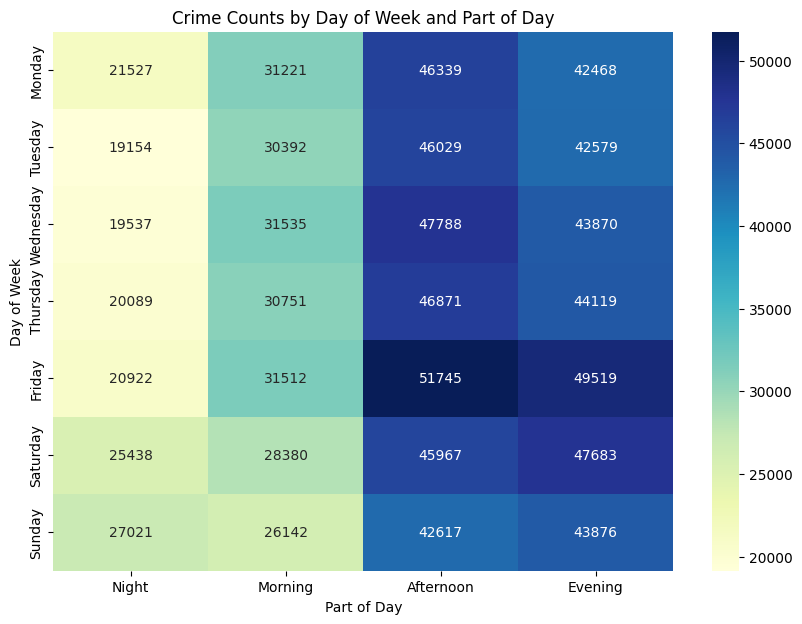

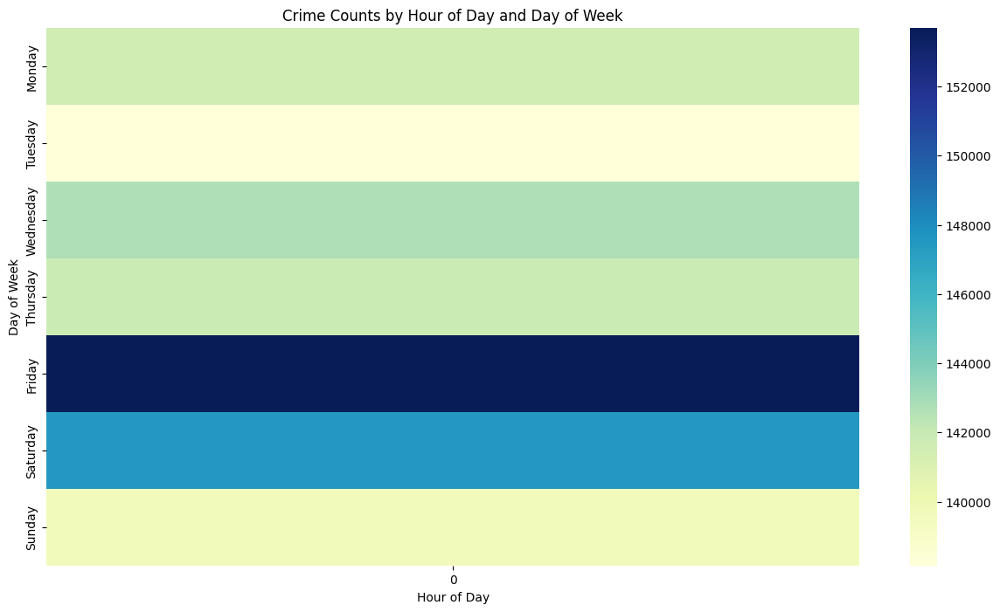

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd # Ensure pandas is imported if not already

# Crime Trends by Day of Week and Part of Day
# Visualize crime counts by day_of_week and part_of_day to identify specific patterns.

# Ensure df_processed is defined by running the preceding cells that create it.
# The variable df_processed should contain the DataFrame with engineered features.

if 'day_of_week' in df_processed.columns and 'part_of_day' in df_processed.columns:
    # Create a crosstab to count crimes by day of week and part of day
    crime_counts_temporal = df_processed.groupby(['day_of_week', 'part_of_day']).size().unstack(fill_value=0)

    # Reorder columns for 'part_of_day'
    part_of_day_order = ['Night', 'Morning', 'Afternoon', 'Evening']
    crime_counts_temporal = crime_counts_temporal[part_of_day_order]

    # Reorder rows for 'day_of_week'
    day_order_numeric = [0, 1, 2, 3, 4, 5, 6] # Monday=0, Sunday=6
    crime_counts_temporal = crime_counts_temporal.reindex(day_order_numeric)

    # Rename numeric day of week to names
    day_name_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
    crime_counts_temporal = crime_counts_temporal.rename(index=day_name_map)


    print("\nCrime Counts by Day of Week and Part of Day:")
    display(crime_counts_temporal)

    # Visualize as a heatmap
    plt.figure(figsize=(10, 7))
    sns.heatmap(crime_counts_temporal, annot=True, fmt='d', cmap='YlGnBu')
    plt.title('Crime Counts by Day of Week and Part of Day')
    plt.xlabel('Part of Day')
    plt.ylabel('Day of Week')
    plt.show()

    # Example: Heatmap showing crime counts by hour of the day and day of the week
    if 'hour_of_day' in df_processed.columns:
        crime_counts_hourly_daily = df_processed.groupby(['day_of_week', 'hour_of_day']).size().unstack(fill_value=0)

        # Reorder rows for 'day_of_week'
        crime_counts_hourly_daily = crime_counts_hourly_daily.reindex(day_order_numeric)
        crime_counts_hourly_daily = crime_counts_hourly_daily.rename(index=day_name_map)

        # Reorder columns for 'hour_of_day'
        # hour_order = range(0, 24)
        # crime_counts_hourly_daily = crime_counts_hourly_daily.reindex(columns=hour_order, fill_value=0)


        plt.figure(figsize=(15, 8))
        sns.heatmap(crime_counts_hourly_daily, annot=False, cmap='YlGnBu') # Set annot=False for cleaner look with many hours
        plt.title('Crime Counts by Hour of Day and Day of Week')
        plt.xlabel('Hour of Day')
        plt.ylabel('Day of Week')
        plt.show()

else:
    print("Skipping temporal trend analysis: 'day_of_week' or 'part_of_day' columns not found in df_processed.")

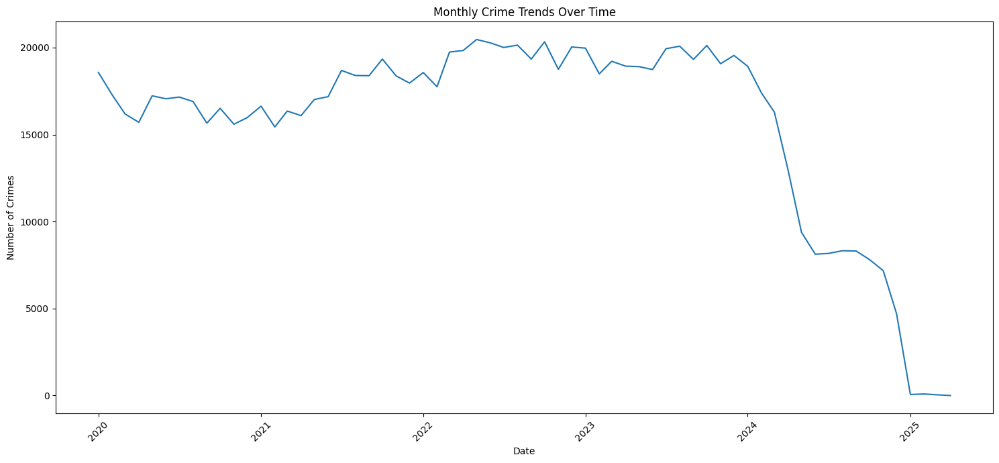

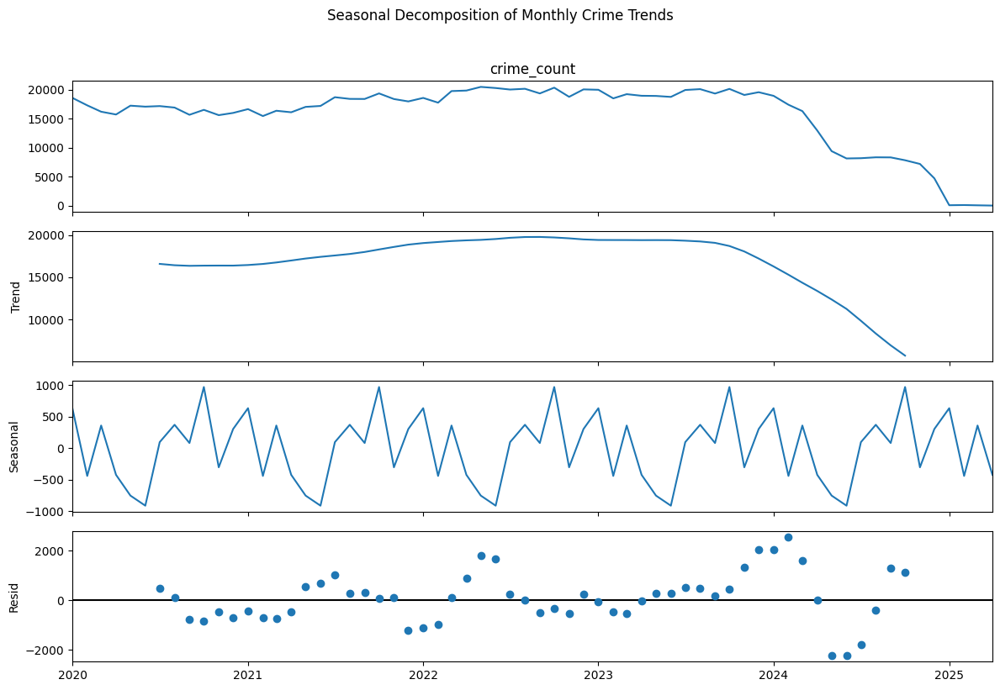

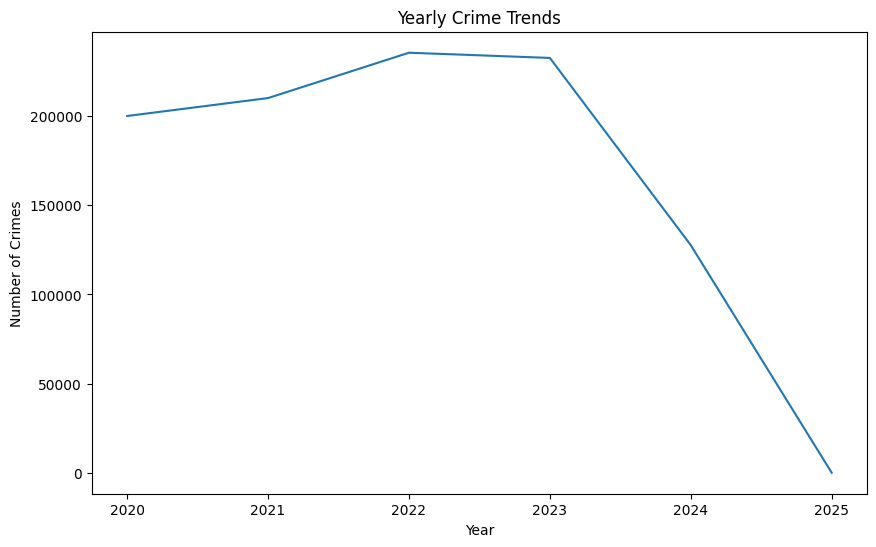

In [ ]:
#Seasonal variations and long-term trends beyond just year-over-year changes code recommendation

import pandas as pd
import matplotlib.pyplot as plt
# Investigate seasonal variations and long-term trends beyond just year-over-year changes
# This requires aggregating crime data over time intervals like months or years.

# Ensure df_processed has 'DATE OCC' and 'year' and 'month' columns
if 'DATE OCC' in df_processed.columns and 'year' in df_processed.columns and 'month' in df_processed.columns:
    try:
        # Group by month and year to analyze seasonal trends
        crime_counts_monthly = df_processed.groupby(['year', 'month']).size().reset_index(name='crime_count')

        # Convert year and month to a datetime index for easier plotting
        crime_counts_monthly['date'] = pd.to_datetime(crime_counts_monthly['year'].astype(str) + '-' + crime_counts_monthly['month'].astype(str) + '-01')
        crime_counts_monthly = crime_counts_monthly.sort_values('date')

        # Plot crime counts over time (monthly trend)
        plt.figure(figsize=(15, 7))
        sns.lineplot(x='date', y='crime_count', data=crime_counts_monthly)
        plt.title('Monthly Crime Trends Over Time')
        plt.xlabel('Date')
        plt.ylabel('Number of Crimes')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        # You can also decompose the time series to explicitly show trend and seasonality
        # This requires installing statsmodels if not already installed: !pip install statsmodels
        try:
            from statsmodels.tsa.seasonal import seasonal_decompose

            # Set the date column as index
            time_series = crime_counts_monthly.set_index('date')['crime_count']

            # Apply seasonal decomposition (additive model is often suitable for crime counts)
            # Adjust period based on your expected seasonality (e.g., 12 for monthly data with yearly seasonality)
            decomposition = seasonal_decompose(time_series, model='additive', period=12)

            # Plot the decomposition
            fig = decomposition.plot()
            fig.set_size_inches(12, 8)
            plt.suptitle('Seasonal Decomposition of Monthly Crime Trends', y=1.02)
            plt.tight_layout()
            plt.show()

        except ImportError:
            print("Statsmodels not installed. Skipping seasonal decomposition.")
        except Exception as e:
            print(f"Error performing seasonal decomposition: {e}")


        # Group by year to analyze long-term trends
        crime_counts_yearly = df_processed.groupby('year').size().reset_index(name='crime_count')

        # Plot crime counts over time (yearly trend)
        plt.figure(figsize=(10, 6))
        sns.lineplot(x='year', y='crime_count', data=crime_counts_yearly)
        plt.title('Yearly Crime Trends')
        plt.xlabel('Year')
        plt.ylabel('Number of Crimes')
        plt.show()

    except Exception as e:
        print(f"An error occurred during seasonal and long-term trend analysis: {e}")

else:
    print("Skipping seasonal and long-term trend analysis: Required date columns ('DATE OCC', 'year', or 'month') not found in df_processed.")



Descriptive Statistics of Time Between Report and Occurrence (Days):


,Time_Between_Report_Occurrence_Days
count,1.005091e+06
mean,1.217435e+01
std,6.915691e+01
min,0.000000e+00
25%,0.000000e+00
50%,1.000000e+00
75%,2.000000e+00
max,1.862000e+03


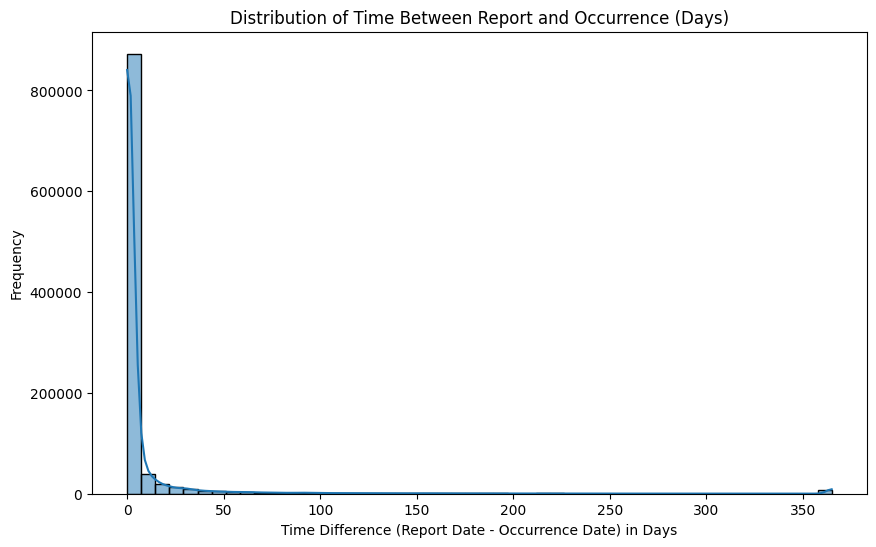


Number of crimes where Occurrence Date is after Report Date: 0


In [ ]:
# Time Between Report and Occurrence
# Calculate the time difference between when a crime occurred and when it was reported could reveal insights into reporting behavior or data inconsistencies.

import matplotlib.pyplot as plt
# Calculate the time difference between Date Rptd and DATE OCC
# Ensure both columns are in datetime format
if 'Date Rptd' in df_processed.columns and 'DATE OCC' in df_processed.columns:
    try:
        # Calculate the time difference in days
        df_processed['Time_Between_Report_Occurrence_Days'] = (df_processed['Date Rptd'] - df_processed['DATE OCC']).dt.days

        # Display descriptive statistics of the time difference
        print("\nDescriptive Statistics of Time Between Report and Occurrence (Days):")
        display(df_processed['Time_Between_Report_Occurrence_Days'].describe())

        # Visualize the distribution of the time difference
        plt.figure(figsize=(10, 6))
        # Filter for reasonable time differences for better visualization (e.g., between -365 and 365 days)
        sns.histplot(df_processed['Time_Between_Report_Occurrence_Days'].clip(lower=-365, upper=365), bins=50, kde=True)
        plt.title('Distribution of Time Between Report and Occurrence (Days)')
        plt.xlabel('Time Difference (Report Date - Occurrence Date) in Days')
        plt.ylabel('Frequency')
        plt.show()

        # Identify cases where occurrence date is after report date (potential data issues)
        future_occurrence_crimes = df_processed[df_processed['Time_Between_Report_Occurrence_Days'] < 0]
        print(f"\nNumber of crimes where Occurrence Date is after Report Date: {len(future_occurrence_crimes)}")
        if not future_occurrence_crimes.empty:
            print("Examples of crimes with Occurrence Date after Report Date:")
            display(future_occurrence_crimes[['DR_NO', 'Date Rptd', 'DATE OCC', 'Time_Between_Report_Occurrence_Days']].head())

    except Exception as e:
        print(f"An error occurred during time difference calculation and analysis: {e}")

else:
    print("Skipping time difference calculation: 'Date Rptd' or 'DATE OCC' columns not found in df_processed.")


### Spatial Analysis

In [ ]:
# Spatial Feature Engineering
# 'AREA' and 'AREA NAME': These are direct categorical spatial features. You can use them as is or potentially encode them (e.g., one-hot encoding).
# 'Rpt Dist No': This provides a more granular spatial level. Treat it as a categorical feature.
# 'LOCATION': This is still a text field (e.g., "100 S MAIN ST"). You could try to extract the street direction (N, S, E, W), the street name, and the block number. However, this might require more complex string manipulation and might not be perfectly consistent. Consider its usefulness compared to the more structured 'AREA' and 'Rpt Dist No'.
# 'LAT' and 'LON': If you decided to keep rows with valid coordinates, these are crucial for spatial analysis. You could:
# Use them directly in distance-based calculations or spatial models.
# Create discretized spatial bins (e.g., grid cells) based on latitude and longitude.

import pandas as pd
# Discretize latitude and longitude into spatial bins
# Example: creating a simple grid
# You can adjust the bin size based on the required granularity
lat_bins = 50 # Number of bins for latitude
lon_bins = 50 # Number of bins for longitude

if 'LAT' in df_cleaned.columns and 'LON' in df_cleaned.columns:
    # Drop rows with missing or invalid LAT/LON before binning
    df_cleaned_spatial = df_cleaned.dropna(subset=['LAT', 'LON']).copy()

    # Create latitude and longitude bins
    df_cleaned_spatial['lat_bin'] = pd.cut(df_cleaned_spatial['LAT'], bins=lat_bins, labels=False)
    df_cleaned_spatial['lon_bin'] = pd.cut(df_cleaned_spatial['LON'], bins=lon_bins, labels=False)

    # Combine lat_bin and lon_bin to create a unique spatial bin ID
    # Handle potential None values from cut for out-of-range values
    df_cleaned_spatial['spatial_bin'] = df_cleaned_spatial.apply(
        lambda row: f"{row['lat_bin']}_{row['lon_bin']}" if pd.notnull(row['lat_bin']) and pd.notnull(row['lon_bin']) else None,
        axis=1
    )

    # Drop rows where spatial_bin could not be created (due to out-of-range LAT/LON)
    df_cleaned_spatial.dropna(subset=['spatial_bin'], inplace=True)


    print("\nDataFrame with spatial bins:")
    display(df_cleaned_spatial[['LAT', 'LON', 'lat_bin', 'lon_bin', 'spatial_bin']].head())

    # Check the number of unique spatial bins
    print("\nNumber of unique spatial bins:", df_cleaned_spatial['spatial_bin'].nunique())

    # You can further analyze crime counts or other characteristics within each spatial bin
    print("\nCrime counts per spatial bin (Top 10):")
    print(df_cleaned_spatial['spatial_bin'].value_counts().head(10))

else:
    print("Skipping spatial feature engineering: 'LAT' or 'LON' columns not found.")

# You can now use 'spatial_bin', 'AREA', 'AREA NAME', 'Rpt Dist No' as categorical spatial features
# and 'LAT', 'LON' directly (for rows where they are valid) for distance calculations or spatial models.

# Example: One-Hot Encoding for 'AREA'
if 'AREA' in df_cleaned_spatial.columns:
    df_cleaned_spatial = pd.get_dummies(df_cleaned_spatial, columns=['AREA'], prefix='AREA')
    print("\nDataFrame after One-Hot Encoding 'AREA':")
    display(df_cleaned_spatial.head())
else:
    print("Skipping One-Hot Encoding for 'AREA': Column not found in df_cleaned_spatial.")


# You can apply similar encoding or direct usage based on your modeling needs for other spatial features.

# Save the DataFrame with engineered features
# Make sure you are saving the DataFrame with engineered features
df_processed = df_cleaned_spatial.copy()

df_processed.to_csv('crime_data_processed.csv', index=False)
print("\nProcessed data saved to 'crime_data_processed.csv'")


DataFrame with spatial bins:


,LAT,LON,lat_bin,lon_bin,spatial_bin
0,34.0375,-118.3506,49,0,49_0
1,34.0444,-118.2628,49,0,49_0
2,34.0210,-118.3002,49,0,49_0
3,34.1576,-118.4387,49,0,49_0
4,34.0820,-118.2130,49,0,49_0



Number of unique spatial bins: 2

Crime counts per spatial bin (Top 10):
spatial_bin
49_0    1002861
0_49       2240
Name: count, dtype: int64

DataFrame after One-Hot Encoding 'AREA':


,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,...,AREA_12,AREA_13,AREA_14,AREA_15,AREA_16,AREA_17,AREA_18,AREA_19,AREA_20,AREA_21
0,190326475,2020-03-01,2020-03-01,2130,Wilshire,784,1,510,VEHICLE - STOLEN,0344,...,False,False,False,False,False,False,False,False,False,False
1,200106753,2020-02-09,2020-02-08,1800,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,...,False,False,False,False,False,False,False,False,False,False
2,200320258,2020-11-11,2020-11-04,1700,Southwest,356,1,480,BIKE - STOLEN,0344 1251,...,False,False,False,False,False,False,False,False,False,False
3,200907217,2023-05-10,2020-03-10,2037,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,...,False,False,False,False,False,False,False,False,False,False
4,200412582,2020-09-09,2020-09-09,0630,Hollenbeck,413,1,510,VEHICLE - STOLEN,0344,...,False,False,False,False,False,False,False,False,False,False



Processed data saved to 'crime_data_processed.csv'


In [ ]:
!pip install pysal

In [ ]:
# Spatial Autocorrelation Analysis
# Analyze spatial patterns in crime distribution using Moran's I.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import libpysal as ps
# Install pysal and splot if not already installed
!pip install pysal splot
from esda.moran import Moran, Moran_Local
# Try importing plot_moran_scatterplot directly from splot.esda
try:
    from splot.esda import plot_moran_scatterplot, lisa_cluster_map
    splot_imported = True
except ImportError:
    print("Could not import plot_moran_scatterplot from splot.esda directly. Will plot manually.")
    splot_imported = False

import numpy as np # Import numpy for standardization

# Assuming df_processed is your DataFrame after cleaning and feature engineering
# Ensure df_processed has 'LAT', 'LON', and a numerical crime count or indicator if needed
# For this example, let's use the presence of a crime event as the variable of interest (1 if crime, 0 otherwise)
# You might replace this with a crime density or rate if you have that calculated.

# For spatial analysis, we need data points with coordinates.
# Let's filter the processed dataframe to include only rows with valid LAT/LON
df_spatial_analysis = df_processed.dropna(subset=['LAT', 'LON']).copy()

# If you want to analyze a variable other than crime occurrence, replace 'crime_indicator'
# For simplicity, let's create a crime indicator (1 for each row, as each row is a crime)
df_spatial_analysis['crime_indicator'] = 1

# Aggregate data by spatial bin to get crime counts per bin
# This is useful if you want to analyze spatial autocorrelation at the bin level
if 'spatial_bin' in df_spatial_analysis.columns:
    crime_counts_per_bin = df_spatial_analysis.groupby('spatial_bin')['crime_indicator'].sum().reset_index()
    print("Crime counts per spatial bin calculated.")
else:
    print("'spatial_bin' column not found. Proceeding with point data if available.")


# Create spatial weights matrix
# Using k-nearest neighbors (adjust k as needed)
# Ensure you have enough data points for KNN
if len(df_spatial_analysis) > 5: # Ensure enough points for k-neighbors
    try:
        # Using coordinates directly for weights
        w = ps.lib.weights.KNN.from_dataframe(df_spatial_analysis, geom_cols=['LON', 'LAT'], k=5)
        w.transform = 'R' # Row-standardization
        print("Spatial weights matrix created using KNN.")
    except Exception as e:
        print(f"Error creating KNN weights matrix: {e}")
        w = None
else:
    print("Not enough data points for spatial weights matrix creation.")
    w = None


if w is not None:
    # Global Moran's I
    # Using the crime_indicator aggregated to spatial bins if available, otherwise using point data
    y = df_spatial_analysis['crime_indicator'].values # Using point data crime indicator
    print("Calculating Global Moran's I on point data.")

    moran = Moran(y, w)

    print("\nGlobal Moran's I:")
    print("Moran's I:", moran.I)
    print("P-value (simulated):", moran.p_sim)


    # Moran Scatterplot
    # Standardize the variable
    z = (y - y.mean()) / y.std()
    # Calculate the spatial lag of the standardized variable
    wz = ps.lib.weights.spatial_lag(w, z)


    plt.figure(figsize=(8, 6))
    if splot_imported:
         # Use the imported function if available
        plot_moran_scatterplot(moran, aspect_equal=True)
        plt.xlabel("Standardized Crime Indicator (z)")
        plt.ylabel("Spatial Lag of Standardized Crime Indicator (Wz)")
        plt.title("Moran Scatterplot (Standardized Variables)")
        plt.grid(True)

        # Add the trend line (slope is Moran's I)
        # Calculate line points for the trend line
        x = np.linspace(z.min(), z.max(), 100)
        y_line = moran.I * x
        plt.plot(x, y_line, color='red', linestyle='--', label=f"Trend Line (Slope = {moran.I:.4f})")
        plt.legend()

        plt.show()
    else:
        # Manually plot the scatterplot if splot function is not imported
        plt.scatter(z, wz, alpha=0.5)
        plt.xlabel("Standardized Crime Indicator (z)")
        plt.ylabel("Spatial Lag of Standardized Crime Indicator (Wz)")
        plt.title("Moran Scatterplot (Standardized Variables)")
        plt.grid(True)

        # Add the trend line (slope is Moran's I)
        # Calculate line points for the trend line
        x = np.linspace(z.min(), z.max(), 100)
        y_line = moran.I * x
        plt.plot(x, y_line, color='red', linestyle='--', label=f"Trend Line (Slope = {moran.I:.4f})")
        plt.legend()

        plt.show()


    # Local Spatial Autocorrelation (LISA)
    # Calculate local Moran's I
    moran_local = Moran_Local(y, w)

    # Print LISA statistics (optional, can be very long for large datasets)
    # print("\nLocal Moran's I:")
    # display(pd.DataFrame({'I_i': moran_local.Is, 'p_sim': moran_local.p_sim}, index=df_spatial_analysis.index).head())


    # Visualize LISA clusters
    # This requires a geodataframe or adding geometry to your dataframe
    # If you have a 'geometry' column in df_spatial_analysis and splot is imported
    # if splot_imported and 'geometry' in df_spatial_analysis.columns:
    #     fig, ax = lisa_cluster_map(moran_local, df_spatial_analysis)
    #     plt.title("LISA Cluster Map")
    #     plt.show()
    # else:
    print("\nLocal Moran's I calculated. To visualize LISA clusters, you typically need a GeoDataFrame.")
    print("You can install geopandas (!pip install geopandas) and create a GeoDataFrame from your LAT/LON columns.")
    print("Then use splot.esda.lisa_cluster_map with the GeoDataFrame and moran_local results, assuming splot.esda.lisa_cluster_map is available.")


else:
    print("\nSkipping spatial autocorrelation analysis due to issues with weights matrix creation.")

Could not import plot_moran_scatterplot from splot.esda directly. Will plot manually.
Crime counts per spatial bin calculated.
Error creating KNN weights matrix: module 'libpysal' has no attribute 'lib'

Skipping spatial autocorrelation analysis due to issues with weights matrix creation.
